In [ ]:
from google.colab import drive
drive.mount('/content/drive') # se connecter à mon google drive

Mounted at /content/drive


In [ ]:
!ls
import os 
#os.listdir('/content/drive/MyDrive') # afficher le contenu du dossier drive/MyDrive
!ls '/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/'
%cd '/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/'
!ls

drive  sample_data
chequeData.csv		 metoo
cmc_7			 micr_E_13b
cv2_training_2.yml	 ocr_cheque_bank_detectio_micr-13b_2.ipynb
cv2_training.yml	 ocr_cheque_bank_detectio_micr-13b.ipynb
data_augmentation.ipynb  ocr_cheque_bank.ipynb
/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr
chequeData.csv		 metoo
cmc_7			 micr_E_13b
cv2_training_2.yml	 ocr_cheque_bank_detectio_micr-13b_2.ipynb
cv2_training.yml	 ocr_cheque_bank_detectio_micr-13b.ipynb
data_augmentation.ipynb  ocr_cheque_bank.ipynb


In [ ]:
! pip3 install opencv-python-headless #==3.4.9.31

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# !pip3 install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import the necessary packages
from skimage.segmentation import clear_border #Clear objects connected to the label image border.
from imutils import contours #define/read close images
import numpy as np
import argparse #recommended command-line parsing module in the Python standard library.
import imutils #Python basic image processing functional package to do image translation, rotation, resizing, skeletonization, or blur amount detection.
import cv2 #open cv is used for image processing/visualization

In [ ]:
def extract_digits_and_symbols(image, charCnts, minW=5, minH=15):
	# grab the internal Python iterator for the list of character
	# contours, then  initialize the character ROI and location
	# lists, respectively
	charIter = charCnts.__iter__()
	rois = []
	locs = []

	# keep looping over the character contours until we reach the end
	# of the list
	while True:
		try:
			# grab the next character contour from the list, compute
			# its bounding box, and initialize the ROI
			c = next(charIter)
			(cX, cY, cW, cH) = cv2.boundingRect(c)
			roi = None

			# check to see if the width and height are sufficiently
			# large, indicating that we have found a digit
			if cW >= minW and cH >= minH:
				# extract the ROI
				roi = image[cY:cY + cH, cX:cX + cW]
				rois.append(roi)
				locs.append((cX, cY, cX + cW, cY + cH))

			# otherwise, we are examining one of the special symbols
			else:
				# MICR symbols include three separate parts, so we
				# need to grab the next two parts from our iterator,
				# followed by initializing the bounding box
				# coordinates for the symbol
				parts = [c, next(charIter), next(charIter)]
				(sXA, sYA, sXB, sYB) = (np.inf, np.inf, -np.inf,
					-np.inf)

				# loop over the parts
				for p in parts:
					# compute the bounding box for the part, then
					# update our bookkeeping variables
					(pX, pY, pW, pH) = cv2.boundingRect(p)
					sXA = min(sXA, pX)
					sYA = min(sYA, pY)
					sXB = max(sXB, pX + pW)
					sYB = max(sYB, pY + pH)

				# extract the ROI
				roi = image[sYA:sYB, sXA:sXB]
				rois.append(roi)
				locs.append((sXA, sYA, sXB, sYB))

		# we have reached the end of the iterator; gracefully break
		# from the loop
		except StopIteration:
			break

	# return a tuple of the ROIs and locations
	return (rois, locs)


In [ ]:
# initialize the list of reference character names, in the same
# order as they appear in the reference image where the digits
# their names and:
# T = Transit (delimit bank branch routing transit #)
# U = On-us (delimit customer account number)
# A = Amount (delimit transaction amount)
# D = Dash (delimit parts of numbers, such as routing or account)
charNames = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "0", "T", "U", "A", "D"]
#charNames = ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9", "A", "B", "C", "D", "E"]

In [ ]:
# Image = Image.open('/content/drive/MyDrive/ChequeDetection/bearer-cheque.jpg')
# load the reference MICR image from disk, convert it to grayscale,
# and threshold it, such that the digits appear as *white* on a
# *black* background
ref = cv2.imread('/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/micr_E_13b/micr_e13b.png')
#ref = cv2.imread('/micr_E_13b/micr_e13b.png')
#ref = cv2.imread('/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/cmc_7/cmc-7_list.png')
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
ref = imutils.resize(ref, width=400)
ref = cv2.threshold(ref, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

In [ ]:
#cv2_imshow(ref)

In [ ]:
#dir(ref)
#import imutils
#from imutils import contours
#help(contours.sort_contours)
#refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#contours.sort_contours(cnts=refCnts, method='left-to-right')

refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
refCnts = imutils.grab_contours(refCnts)
refCnts = contours.sort_contours(refCnts, method="left-to-right")[0]

clone = np.dstack([ref.copy()] * 3)

In [ ]:
# find contours in the MICR image (i.e,. the outlines of the
# characters) and sort them from left to right
"""
refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
refCnts = refCnts[0] if imutils.is_cv2() else refCnts[1]
refCnts = contours.sort_contours(refCnts, method="left-to-right")[0]

# create a clone of the original image so we can draw on it
clone = np.dstack([ref.copy()] * 3)
"""

In [ ]:

# create a clone of the original image so we can draw on it
clone = np.dstack([ref.copy()] * 3)

# loop over the (sorted) contours
for c in refCnts:
	# compute the bounding box of the contour and draw it on our
	# image
	(x, y, w, h) = cv2.boundingRect(c)
	cv2.rectangle(clone, (x, y), (x + w, y + h), (0, 255, 0), 2)

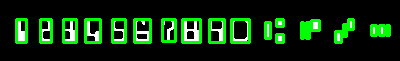

In [ ]:
# show the output of applying the simple contour method
from google.colab.patches import cv2_imshow
cv2_imshow(clone)

In [ ]:
# extract the digits and symbols from the list of contours, then
# initialize a dictionary to map the character name to the ROI
(refROIs, refLocs) = extract_digits_and_symbols(ref, refCnts,
	minW=10, minH=20)
chars = {}

# re-initialize the clone image so we can draw on it again
clone = np.dstack([ref.copy()] * 3)

In [ ]:
chemin_dossier_img = '/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/micr_E_13b/gen_origine/'
n = 0
for i in refROIs:
  n=n+1
  cv2_imshow(i)
  #print(chemin_dossier_img+str(n)+".png")
  #> cv2.imwrite(chemin_dossier_img+str(n)+".png", i)


In [ ]:
for i in refLocs:
  print(i)

(16, 19, 26, 42)
(40, 19, 51, 42)
(63, 19, 76, 42)
(85, 19, 100, 42)
(112, 19, 125, 42)
(134, 19, 150, 42)
(162, 19, 175, 41)
(182, 19, 200, 42)
(209, 19, 224, 42)
(231, 19, 249, 42)
(265, 19, 283, 42)
(301, 20, 319, 38)
(335, 19, 353, 42)
(371, 25, 389, 35)


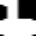

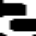

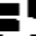

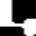

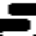

...

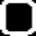

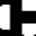

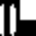

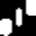

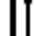

In [ ]:
# loop over the reference ROIs and locations
n = 0
# size_chose = 36
for (name, roi, loc) in zip(charNames, refROIs, refLocs):
	n = n+1
	# draw a bounding box surrounding the character on the output
	# image
	(xA, yA, xB, yB) = loc
	cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

	# resize the ROI to a fixed size, then update the characters
	# dictionary, mapping the character name to the ROI
	size_chose = 36 # 160 # 36
	"""
	for size_chose in range(28, 160, 1):
		roi_r = cv2.resize(roi, (size_chose, size_chose)) 
		chars[name] = roi_r

		# display the character ROI to our screen
		#cv2_imshow(roi)
		# cv2.waitKey(0)
		
		cv2.imwrite(chemin_dossier_img+str(n)+"_"+str(n)+"_to2_{}.png".format(str(size_chose)), roi_r)
	"""
	roi = cv2.resize(roi, (size_chose, size_chose)) 
	chars[name] = roi
	# display the character ROI to our screen
	cv2_imshow(roi)
	#print(str(chars[name]))
 

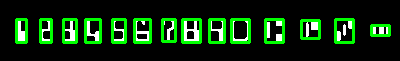

In [ ]:
# show the output of our better method
cv2_imshow(clone)

In [ ]:

#chars

In [ ]:
# initialize a rectangular kernel (wider than it is tall) along with
# an empty list to store the output of the check OCR
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (17, 7))
output = []
# load the input image, grab its dimensions, and apply array slicing
# to keep only the bottom 20% of the image (that's where the account
# information is)
fileNames = ['/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/metoo/test_ca.jpeg']
#fileNames = ['/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/metoo/007.png']

inputFile = fileNames[0]
image = cv2.imread(inputFile)
(h,w) = image.shape[:2]

delta = int(h - (h * 0.2))
bottom = image[delta:h, 0:w]


In [ ]:
#dir(image)

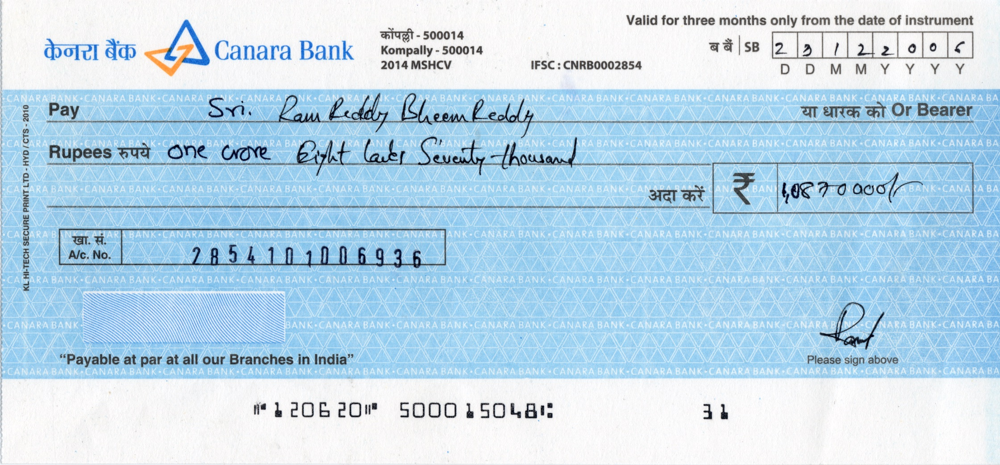

In [ ]:
cv2_imshow(image)

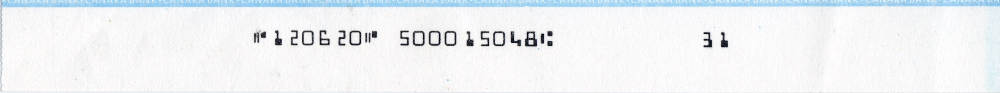

In [ ]:
cv2_imshow(bottom)

In [ ]:
# convert the bottom image to grayscale, then apply a blackhat
# morphological operator to find dark regions against a light
# background (i.e., the routing and account numbers)
gray = cv2.cvtColor(bottom, cv2.COLOR_BGR2GRAY)
blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKernel)

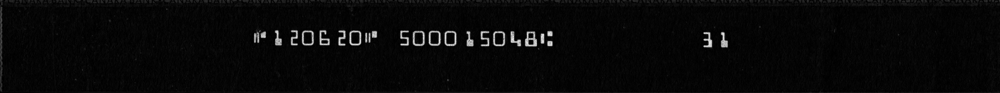

In [ ]:
cv2_imshow(blackhat)

In [ ]:
# compute the Scharr gradient of the blackhat image, then scale
# the rest back into the range [0, 255]
gradX = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0,
	ksize=7)
gradX = np.absolute(gradX)
(minVal, maxVal) = (np.min(gradX), np.max(gradX))
gradX = (255 * ((gradX - minVal) / (maxVal - minVal)))
gradX = gradX.astype("uint8")

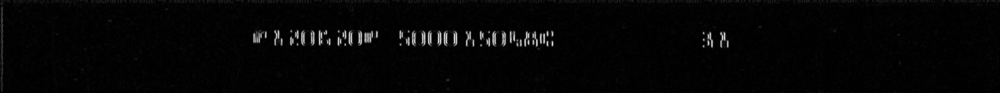

In [ ]:
cv2_imshow(gradX)

In [ ]:
# apply a closing operation using the rectangular kernel to help
# cloes gaps in between rounting and account digits, then apply
# Otsu's thresholding method to binarize the image
gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKernel)
gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKernel)
thresh = cv2.threshold(gradX, 0, 255,
cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

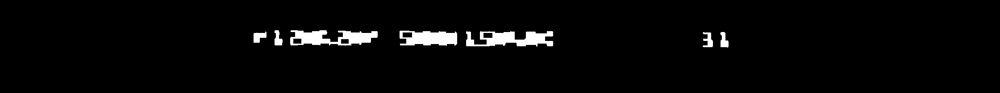

In [ ]:
cv2_imshow(thresh)

In [ ]:
# remove any pixels that are touching the borders of the image (this
# simply helps us in the next step when we prune contours)
thresh = clear_border(thresh)

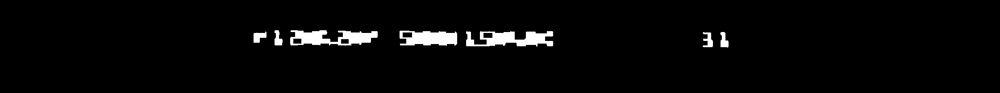

In [ ]:
cv2_imshow(thresh)

In [ ]:
# find contours in the thresholded image, then initialize the
# list of group locations
groupCnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
groupCnts = imutils.grab_contours(groupCnts)
groupLocs = []
# loop over the group contours
for (i, c) in enumerate(groupCnts):
	# compute the bounding box of the contour
	(x, y, w, h) = cv2.boundingRect(c)
	# only accept the contour region as a grouping of characters if
	# the ROI is sufficiently large
	if w > 5 and h > 5:
		groupLocs.append((x, y, w, h))
# sort the digit locations from left-to-right
groupLocs = sorted(groupLocs, key=lambda x:x[0])

In [ ]:
#import cv2
recognizer1 = cv2.face.LBPHFaceRecognizer_create()
recognizer1.read("/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/cv2_training_2.yml")

In [ ]:
chemin_dossier_img2 = "/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/micr_E_13b/gen_origine2/"

12 0.0


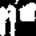

1 0.0


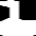

2 0.0


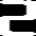

10 0.0


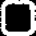

6 0.0


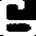

2 0.0


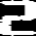

10 0.0


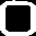

12 0.0


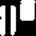

5 0.0


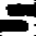

10 0.0


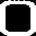

10 0.0


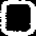

10 0.0


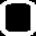

1 0.0


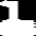

5 0.0


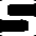

10 0.0


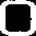

4 0.0


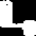

8 0.0


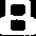

11 0.0


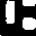

3 0.0


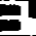

1 0.0


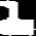

In [ ]:
#recognizer1 = cv2.face.LBPHFaceRecognizer_create()
#recognizer1.read("/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/cv2_training.yml")

#charNames = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "0", "T", "U", "A", "D"]
char_dict = {"1":"1", "2":"2", "3":"3", "4":"4",
             "5":"5", "6":"6", "7":"7", "8":"8",
             "9":"9", "10":"0", "11":"T", "12":"U",
             "13":"A", "14":"D"
             }
output = []
inputFile_1 = '/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/metoo/test_ca.jpeg'
#image = cv2.imread(inputFile)
image = cv2.imread(inputFile_1)
n=0
# loop over the group locations
for (gX, gY, gW, gH) in groupLocs:
	# initialize the group output of characters
	groupOutput = []
	# extract the group ROI of characters from the grayscale
	# image, then apply thresholding to segment the digits from
	# the background of the credit card
	group = gray[gY - 15:gY + gH + 15, gX - 15:gX + gW + 15]
	group = cv2.threshold(group, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
	#> cv2_imshow(group)
	#cv2.waitKey(0)
	# find character contours in the group, then sort them from
	# left to right
	charCnts = cv2.findContours(group.copy(), cv2.RETR_EXTERNAL, 	cv2.CHAIN_APPROX_SIMPLE)
	charCnts = cv2.findContours(group, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	charCnts = imutils.grab_contours(charCnts)
	charCnts = contours.sort_contours(charCnts, method="left-to-right")[0]
  	# find the characters and symbols in the group
	(rois, locs) = extract_digits_and_symbols(group, charCnts, minW=15, minH=20)
	# loop over the ROIs from the group
	
	for roi in rois:
		# initialize the list of template matching scores and
		# resize the ROI to a fixed size
		scores = []
		roi = cv2.resize(roi, (size_chose, size_chose)) # 36 ou 160
		# loop over the reference character name and corresponding
		# ROI
		"""
		for charName in charNames:
			# apply correlation-based template matching, take the
			# score, and update the scores list
			result = cv2.matchTemplate(roi, chars[charName], cv2.TM_CCOEFF)
			(_, score, _, _) = cv2.minMaxLoc(result)
			scores.append(score)
			
	 
		# the classification for the character ROI will be the
		# reference character name with the *largest* template
		# matching score
		groupOutput.append(charNames[np.argmax(scores)])
		"""
		#gray = cv2.cvtColor(frame ,cv2.COLOR_BGR2GRAY)
		roi_gray = roi #  cv2.cvtColor(roi , cv2.COLOR_BGR2GRAY) #gray[]
		#gray = cv2.cvtColor(bottom, cv2.COLOR_BGR2GRAY)
		prediction, conf = recognizer1.predict(roi_gray)
		prediction_char = char_dict[str(prediction) ]

		print(prediction, conf)
		cv2_imshow(roi)
		n=n+1
		#cv2.imwrite(chemin_dossier_img2+str(prediction)+"_"+str(n)+"_to4_{}.png".format(str(size_chose)), roi)

		groupOutput.append(prediction_char)
		

  	# draw (padded) bounding box surrounding the group along with
    # the OCR output of the group
    	# draw (padded) bounding box surrounding the group along with
	
	# the OCR output of the group
	cv2.rectangle(image, (gX - 10, gY + delta - 10), (gX + gW + 10, gY + gY + delta), (0, 0, 255), 2)
	cv2.putText(image, "".join(groupOutput), (gX - 10, gY + delta - 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 1)
	# add the group output to the overall check OCR output
	
	output.append("".join(groupOutput))

Check OCR: U 1 20620U 5000 15048T 3 1


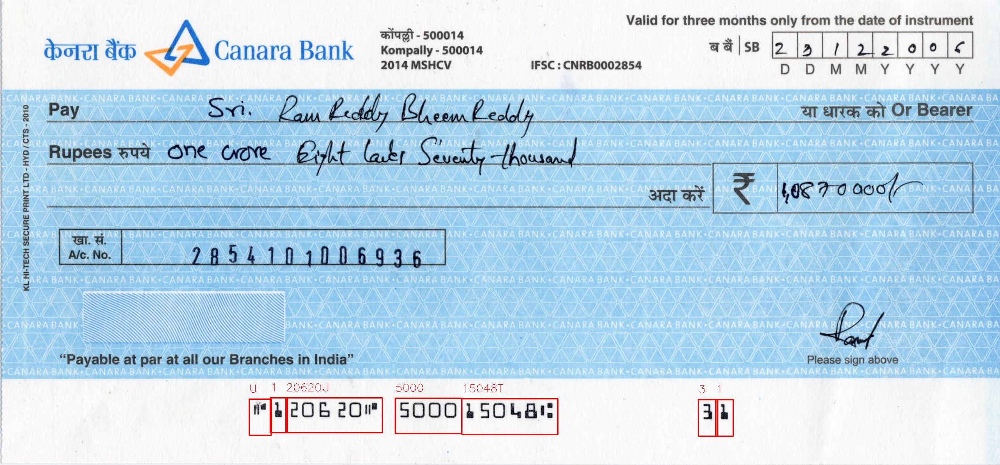

In [ ]:
# display the output check OCR information to the screen
print("Check OCR: {}".format(" ".join(output)))
cv2_imshow(image)
#cv2.waitKey(0)

In [ ]:
output = ''.join(output)
print("Check MICR13b code : {}".format(output))
chequeNum = ''
idx = output[1:].find(output[0])

chequeNum = output[:8]
micrCode = output[8:]
print("chequeNum :", chequeNum)
print("micrCode :",micrCode)


Check MICR13b code : U120620U500015048T31
chequeNum : U120620U
micrCode : 500015048T31


In [ ]:
# Now we start the python tesseract
!pip install pillow
!pip install pytesseract
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 17.2 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 21 not upgraded.
Need to get 4,850 kB of archives.
After this operation, 16.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1 [1,598 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr amd64 4.1.1-2build2 [262 kB]
Fetched 4,850 kB in 2s (2,031 kB/s)
debconf: unable to initialize fronten

In [ ]:
# import the necessary packages
from PIL import Image
import pytesseract
import argparse
import cv2
import os

In [ ]:
!ls -alrt /usr/bin/tesseract

-rwxr-xr-x 1 root root 35056 Mar  3  2020 /usr/bin/tesseract


In [ ]:
!ls

chequeData.csv		 metoo
cmc_7			 micr_E_13b
cv2_training_2.yml	 ocr_cheque_bank_detectio_micr-13b_2.ipynb
cv2_training.yml	 ocr_cheque_bank_detectio_micr-13b.ipynb
data_augmentation.ipynb  ocr_cheque_bank.ipynb


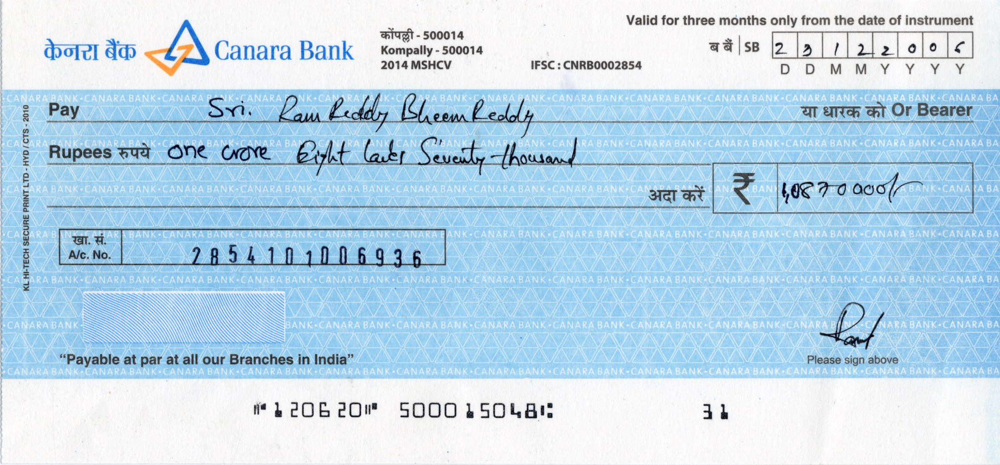

In [ ]:
filename = fileNames[0]
Image.open(filename)

KL HI-TECH SECURE PRINT LTD - HYD/ CTS - 2010

ole da tA Canara Bank

Pay Swi.

miugt - 500014

Kompally - 500014
2014 MSHCV

Valid for three months only from the date of instrument

wa|ss [2 |» | 7| 2/2] ole |<!

IFSC : CNRB0002854 0 ' DM RNY Vo ve

at atch cat Or Bearer

Rupees ua ONC (Cre Brkt lake Geuety —Chousaned

a. a.
Alc. No. . | 1 i &

 

“Payable at par at all our Branches in India”

"206 20

we @ ered

Please sign above

5000 250448: ah



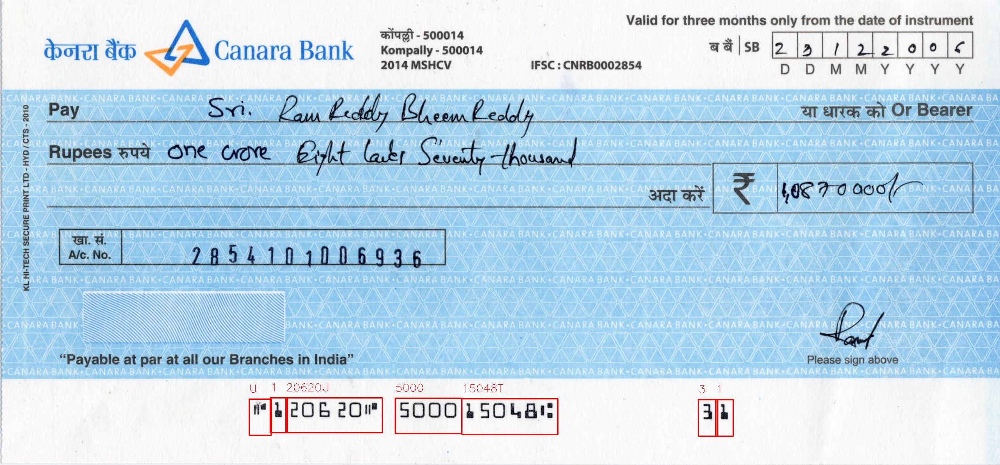

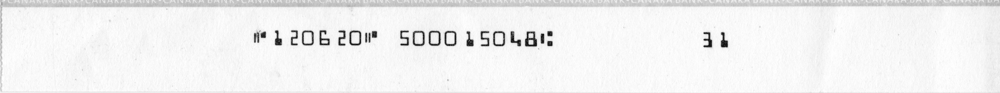

In [ ]:
# load the image as a PIL/Pillow image, apply OCR, and then delete
# the temporary file
from google.colab.patches import cv2_imshow
# cv2_imshow(clone)
text = pytesseract.image_to_string(Image.open(filename), lang="eng")
#> os.remove(filename)
print(text)
# show the output images
cv2_imshow(image)
cv2_imshow(gray)

In [ ]:
lines = text.split('\n')
lines
     

['KL HI-TECH SECURE PRINT LTD - HYD/ CTS - 2010',
 '',
 'ole da tA Canara Bank',
 '',
 'Pay Swi.',
 '',
 'miugt - 500014',
 '',
 'Kompally - 500014',
 '2014 MSHCV',
 '',
 'Valid for three months only from the date of instrument',
 '',
 'wa|ss [2 |» | 7| 2/2] ole |<!',
 '',
 "IFSC : CNRB0002854 0 ' DM RNY Vo ve",
 '',
 'at atch cat Or Bearer',
 '',
 'Rupees ua ONC (Cre Brkt lake Geuety —Chousaned',
 '',
 'a. a.',
 'Alc. No. . | 1 i &',
 '',
 ' ',
 '',
 '“Payable at par at all our Branches in India”',
 '',
 '"206 20',
 '',
 'we @ ered',
 '',
 'Please sign above',
 '',
 '5000 250448: ah',
 '\x0c']

In [ ]:
accountNum = ''
ifscCode = ''
import re
regexp = re.compile('IFS')
for line in lines[:-4]:
  num = re.findall(r'\d+', line)
  num = ''.join(num)
  if(len(num)>12):
    accountNum = num
    break 

for line in lines:
  if(regexp.search(line)):
    segments = line.split(' ')
    code = re.findall(r'\d+', line)
    regexp1 = re.compile(code[0])
    for seg in segments:
      if(regexp1.search(seg)):
        ifscCode = seg
        break
    break
print("ifscCode",ifscCode)
print("accountNum",accountNum)

ifscCode CNRB0002854
accountNum 


In [ ]:
print(ifscCode)

CNRB0002854


In [ ]:
print(accountNum)

In [ ]:
import os

# The list of column names as mentioned in the CSV file
headersCSV = ['CHEQUE-NUMBER','MICR-CODE','IFSC-CODE','ACCOUNT-NUMBER']

if( not os.path.isfile('/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/chequeData.csv')):
  import csv

  # open the file in the write mode
  f = open('/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/chequeData.csv', 'w')

  # create the csv writer
  writer = csv.writer(f)

  # write a row to the csv file
  writer.writerow(headersCSV)

  # close the file
  f.close()

In [ ]:
# Pre-requisite - Import the DictWriter class from csv  module
from csv import DictWriter
  
# The list of column names as mentioned in the CSV file
headersCSV = ['CHEQUE-NUMBER','MICR-CODE','IFSC-CODE','ACCOUNT-NUMBER']      
# The data assigned to the dictionary 
dict={'CHEQUE-NUMBER':chequeNum,'MICR-CODE':micrCode,'IFSC-CODE':ifscCode,'ACCOUNT-NUMBER':accountNum}
  
# Pre-requisite - The CSV file should be manually closed before running this code.

# First, open the old CSV file in append mode, hence mentioned as 'a'
# Then, for the CSV file, create a file object
with open('/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/chequeData.csv', 'a', newline='') as f_object:
    # Pass the CSV  file object to the Dictwriter() function
    # Result - a DictWriter object
    dictwriter_object = DictWriter(f_object, fieldnames=headersCSV)
    # Pass the data in the dictionary as an argument into the writerow() function
    dictwriter_object.writerow(dict)
    # Close the file object
    f_object.close()


In [ ]:
import pandas as pd

data= pd.read_csv("/content/drive/MyDrive/Colab Notebooks/detection_anomaly/ocr/chequeData.csv")
data

,CHEQUE-NUMBER,MICR-CODE,IFSC-CODE,ACCOUNT-NUMBER
0,T120620U,500015048431,NaN,NaN
1,T120620U,500015048431,CNRB0002854,NaN
2,U120620U,500015048T31,CNRB0002854,NaN
